In [1]:
# importing necessary libraries and configurations
import pandas as pd
import matplotlib.pyplot as plt
from fbprophet import Prophet
from fbprophet.plot import plot_plotly

plt.style.use("fivethirtyeight")
%matplotlib inline

In [2]:
# loading the data set
df = pd.read_csv("df_41.csv")

In [3]:
# data cleaning and indexing
df.drop("zip_code", axis=1, inplace=True)

df.occurred_date_time = df.occurred_date_time.astype("datetime64")
df.set_index(["occurred_date_time"], inplace=True)
df.sort_index(inplace=True)

# examining the new data frame
display(df.head())
display(df.tail())

,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,
2003-01-01 00:00:00,IDENTITY THEFT,N,2012-05-25 11:04:00,RESIDENCE / HOME,1105 LILY TER,3.0,HE,3.0,N,2012-05-25 00:00:00,30.234098,-97.701901,2003,1,1,1,0
2003-01-01 00:01:00,IDENTITY THEFT,N,2015-03-12 10:17:00,RESIDENCE / HOME,1817 E OLTORF ST,3.0,HE,2.0,N,2015-03-12 00:00:00,30.231615,-97.736458,2003,1,1,1,0
2003-01-01 00:01:00,IDENTITY THEFT,N,2008-07-23 11:07:00,RESIDENCE / HOME,2430 CROMWELL CIR,3.0,HE,4.0,NaN,2008-08-25 00:00:00,30.226640,-97.721057,2003,1,1,1,0
2003-01-01 00:01:00,AGG SEXUAL ASSAULT CHILD/OBJEC,Y,2015-07-03 08:11:00,RESIDENCE / HOME,6400 BLOCK LYNCH LN,3.0,HE,5.0,N,2016-05-31 00:00:00,NaN,NaN,2003,1,1,1,0
2003-01-01 00:01:00,IDENTITY THEFT,N,2011-03-07 15:00:00,RESIDENCE / HOME,1845 BURTON DR,3.0,HE,2.0,N,2011-03-16 00:00:00,30.234429,-97.729699,2003,1,1,1,0


,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,
2020-12-11 22:17:00,AGG ASSAULT,N,2020-12-11 22:17:00,STREETS / HWY / ROAD / ALLEY,2400 BLOCK WILLOW HILL DR,3.0,HE,2.0,NaN,NaN,30.233321,-97.725276,2020,12,50,11,22
2020-12-12 01:00:00,BURGLARY OF VEHICLE,N,2020-12-12 16:00:00,STREETS / HWY / ROAD / ALLEY,2501 WICKERSHAM LN,3.0,HE,4.0,NaN,NaN,30.223501,-97.725338,2020,12,50,12,1
2020-12-12 08:17:00,AGG ASSAULT FAM/DATE VIOLENCE,Y,2020-12-12 08:17:00,RESIDENCE / HOME,6934 E BEN WHITE BLVD SVRD WB,3.0,HE,5.0,C,2020-12-12 00:00:00,30.215663,-97.703550,2020,12,50,12,8
2020-12-12 15:25:00,THEFT BY SHOPLIFTING,N,2020-12-12 16:06:00,GROCERY / SUPERMARKET,2505 E RIVERSIDE DR,3.0,HE,2.0,NaN,NaN,30.234192,-97.724549,2020,12,50,12,15
2020-12-12 18:44:00,DISRUPTING MEETING/PROCESSION,N,2020-12-12 18:44:00,STREETS / HWY / ROAD / ALLEY,1600 S PLEASANT VALLEY RD,3.0,HE,2.0,NaN,NaN,30.238012,-97.720613,2020,12,50,12,18


In [4]:
# Creating violent crime and murder data frames for analysis
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)
df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

# Annual overall crime (2017-present)
df_17 = df[df.year == 2017]
df_18 = df[df.year == 2018]
df_19 = df[df.year == 2019]
df_20 = df[df.year == 2020]

# Annual violent crime (2017-present)
df_viol_17 = df_viol[df_viol.year == 2017]
df_viol_18 = df_viol[df_viol.year == 2018]
df_viol_19 = df_viol[df_viol.year == 2019]
df_viol_20 = df_viol[df_viol.year == 2020]

# Annual murders (2017-present)
df_viol_mur_17 = df_viol_mur[df_viol_mur.year == 2017]
df_viol_mur_18 = df_viol_mur[df_viol_mur.year == 2018]
df_viol_mur_19 = df_viol_mur[df_viol_mur.year == 2019]
df_viol_mur_20 = df_viol_mur[df_viol_mur.year == 2020]

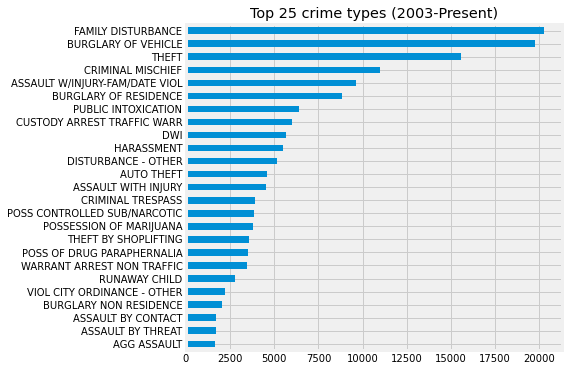

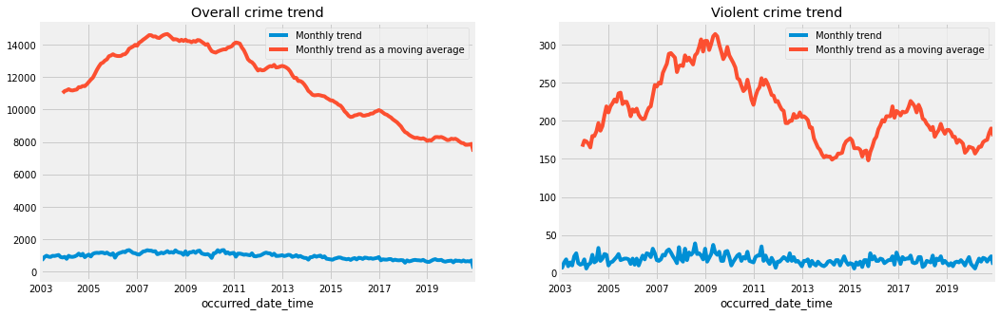

In [5]:
# Top 25 crime types
df.highest_offense_description.value_counts().head(25).sort_values().plot.barh(
    figsize=(6, 6), title="Top 25 crime types (2003-Present)"
)
plt.show()

fig, axs = plt.subplots(ncols=2, figsize=(16, 5))
df.resample("M").size().plot(ax=axs[0])
df.resample("M").size().rolling(12).sum().plot(title="Overall crime trend", ax=axs[0])
axs[0].legend(["Monthly trend", "Monthly trend as a moving average"])
df_viol.resample("M").size().plot(ax=axs[1])
df_viol.resample("M").size().rolling(12).sum().plot(
    title="Violent crime trend", ax=axs[1]
)
axs[1].legend(["Monthly trend", "Monthly trend as a moving average"])
plt.show()

Overalln crime 2017-present


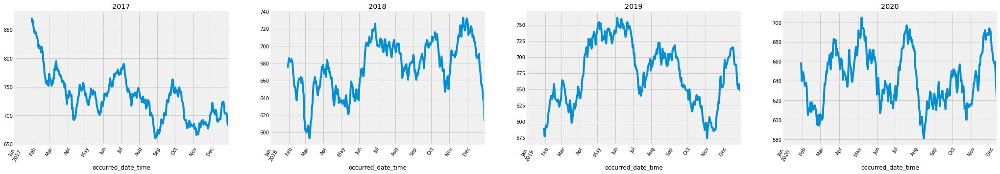

Violent crime 2017-present


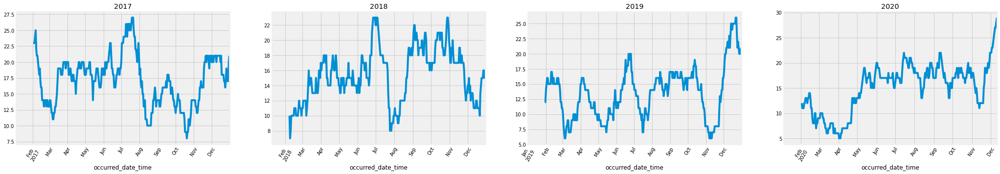

In [6]:
print("===========================")
print("Overalln crime 2017-present")
print("===========================")
fig, axs = plt.subplots(ncols=4, figsize=(32, 5))
df_17.resample("D").size().rolling(30).sum().plot(rot=60, title="2017", ax=axs[0])
df_18.resample("D").size().rolling(30).sum().plot(rot=60, title="2018", ax=axs[1])
df_19.resample("D").size().rolling(30).sum().plot(rot=60, title="2019", ax=axs[2])
df_20.resample("D").size().rolling(30).sum().plot(rot=60, title="2020", ax=axs[3])
plt.show()

print("==========================")
print("Violent crime 2017-present")
print("==========================")
fig, axs = plt.subplots(ncols=4, figsize=(32, 5))
df_viol_17.resample("D").size().rolling(30).sum().plot(rot=60, title="2017", ax=axs[0])
df_viol_18.resample("D").size().rolling(30).sum().plot(rot=60, title="2018", ax=axs[1])
df_viol_19.resample("D").size().rolling(30).sum().plot(rot=60, title="2019", ax=axs[2])
df_viol_20.resample("D").size().rolling(30).sum().plot(rot=60, title="2020", ax=axs[3])
plt.show()

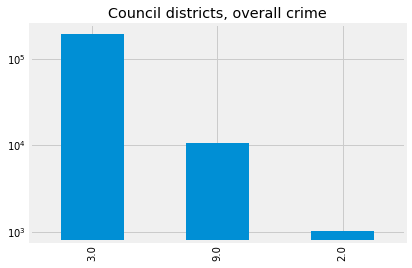

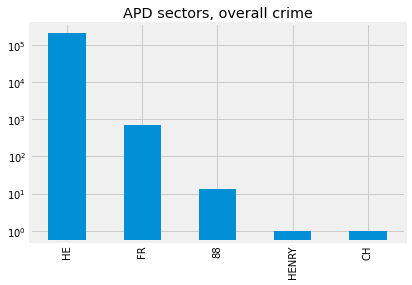

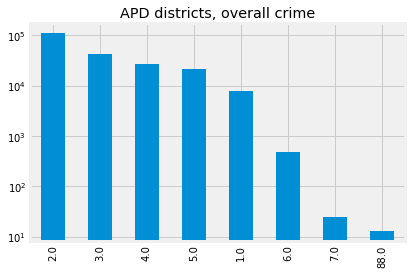

In [12]:
# Showing overall crime rates by council districts, APD districts, and sectors
df.council_district.value_counts().plot.bar(
    title="Council districts, overall crime", logy=True
)
plt.show()

df.apd_sector.value_counts().plot.bar(title="APD sectors, overall crime", logy=True)
plt.show()

df.apd_district.value_counts().plot.bar(title="APD districts, overall crime", logy=True)
plt.show()

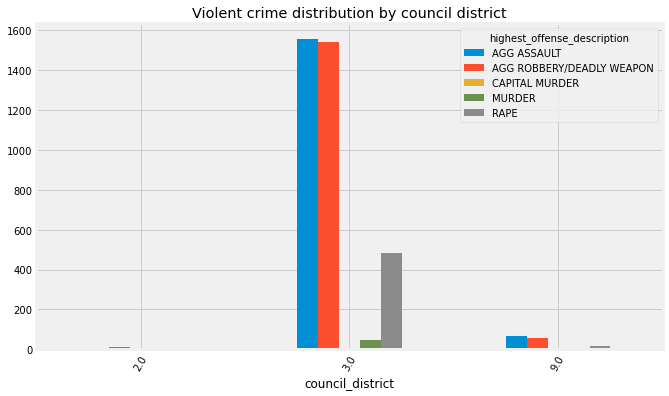

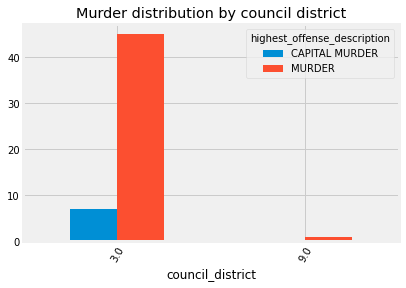

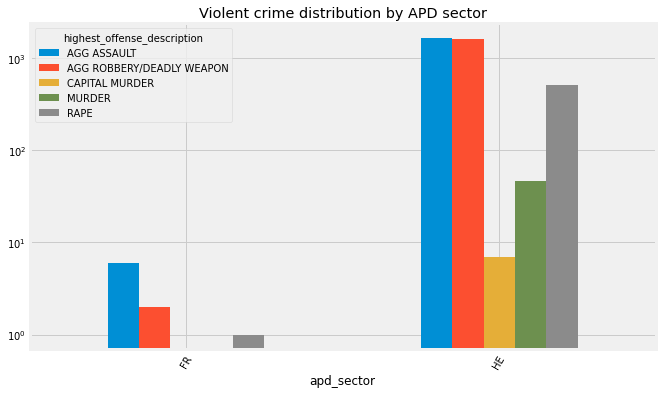

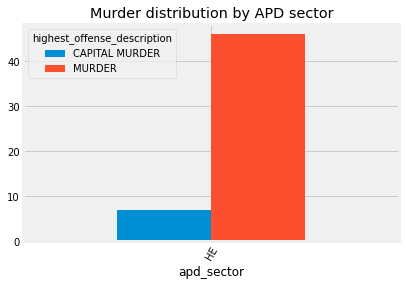

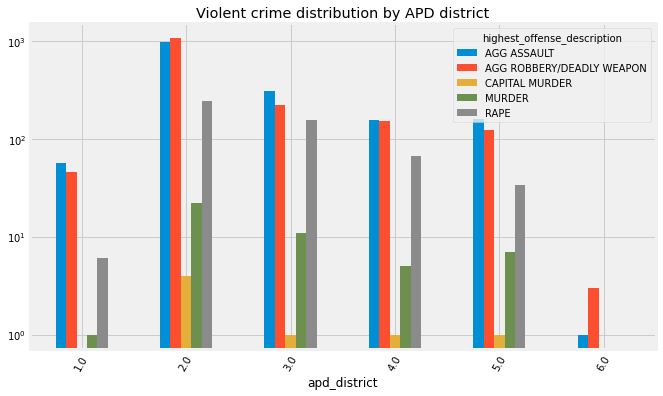

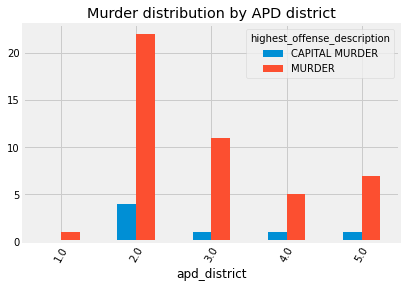

In [8]:
pd.crosstab(df_viol.council_district, df_viol.highest_offense_description).plot.bar(
    rot=60, figsize=(10, 6), title="Violent crime distribution by council district"
)
plt.show()

pd.crosstab(
    df_viol_mur.council_district, df_viol_mur.highest_offense_description
).plot.bar(rot=60, title="Murder distribution by council district")
plt.show()

pd.crosstab(df_viol.apd_sector, df_viol.highest_offense_description).plot.bar(
    rot=60, figsize=(10, 6), logy=True, title="Violent crime distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol_mur.apd_sector, df_viol_mur.highest_offense_description).plot.bar(
    rot=60, title="Murder distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol.apd_district, df_viol.highest_offense_description).plot.bar(
    rot=60,
    figsize=(10, 6),
    logy=True,
    title="Violent crime distribution by APD district",
)
plt.show()

pd.crosstab(df_viol_mur.apd_district, df_viol_mur.highest_offense_description).plot.bar(
    rot=60, title="Murder distribution by APD district"
)
plt.show()

highest_offense_description,AGG ASSAULT,AGG ROBBERY/DEADLY WEAPON,CAPITAL MURDER,MURDER,RAPE
location_type,,,,,
BANKS / SAVINGS & LOAN,1,0,0,0,1
BAR / NIGHT CLUB,57,10,0,0,2
CAMP / CAMPGROUND,0,1,0,0,0
CHURCH / SYNAGOGUE / TEMPLE / MOSQUE,0,1,0,0,0
COMMERCIAL / OFFICE BUILDING,20,68,0,0,3
CONSTRUCTION SITE,1,0,0,0,1
CONVENIENCE STORE,28,69,0,0,1
DEPARTMENT / DISCOUNT STORE,0,5,0,0,0
DRUG STORE / DR. OFFICE / HOSPITAL,0,3,0,0,1


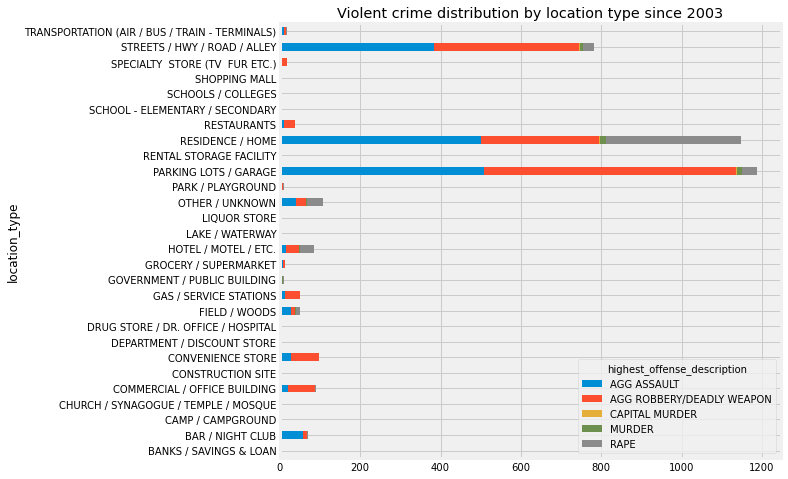

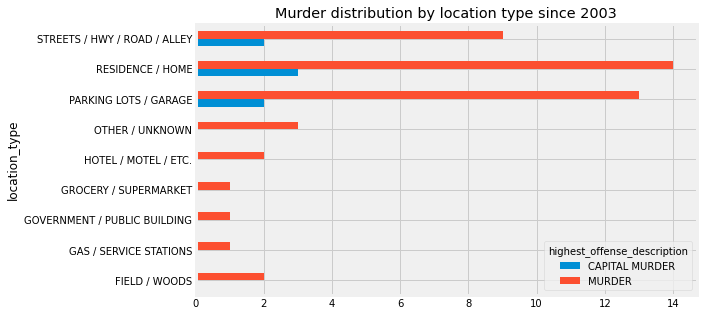

In [13]:
viol_loc = pd.crosstab(df_viol.location_type, df_viol.highest_offense_description)
display(viol_loc)

mur_loc = pd.crosstab(
    df_viol_mur.location_type, df_viol_mur.highest_offense_description
)

viol_loc.plot.barh(
    figsize=(8, 8),
    title="Violent crime distribution by location type since 2003",
    stacked=True,
)
plt.show()

mur_loc.plot.barh(
    figsize=(8, 5), title="Murder distribution by location type since 2003"
)
plt.show()

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


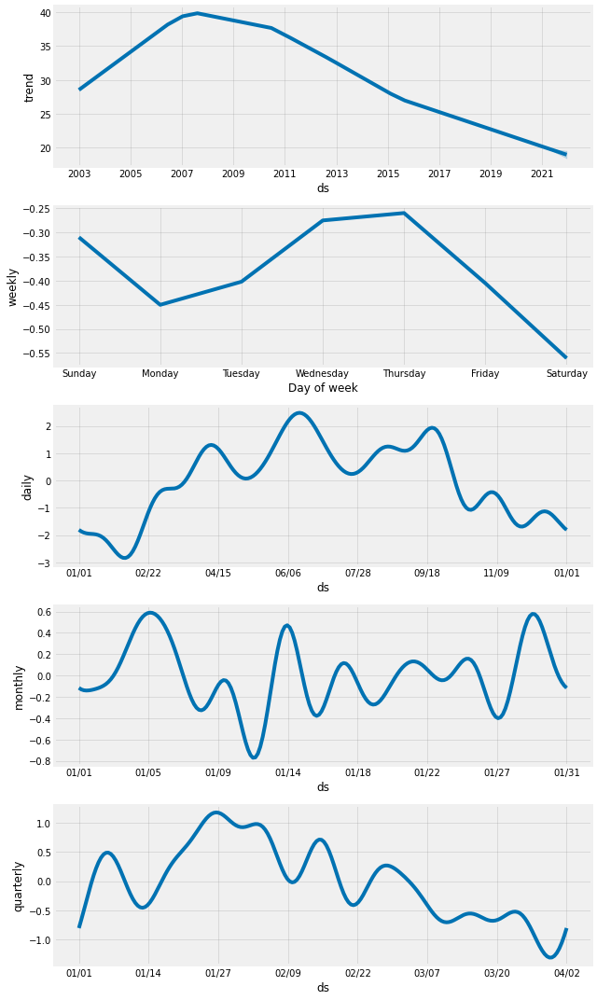

In [10]:
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95, yearly_seasonality=False)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")
pred = m.predict(future)

fig2 = m.plot_components(pred)
fig2_1 = plot_plotly(m, pred)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


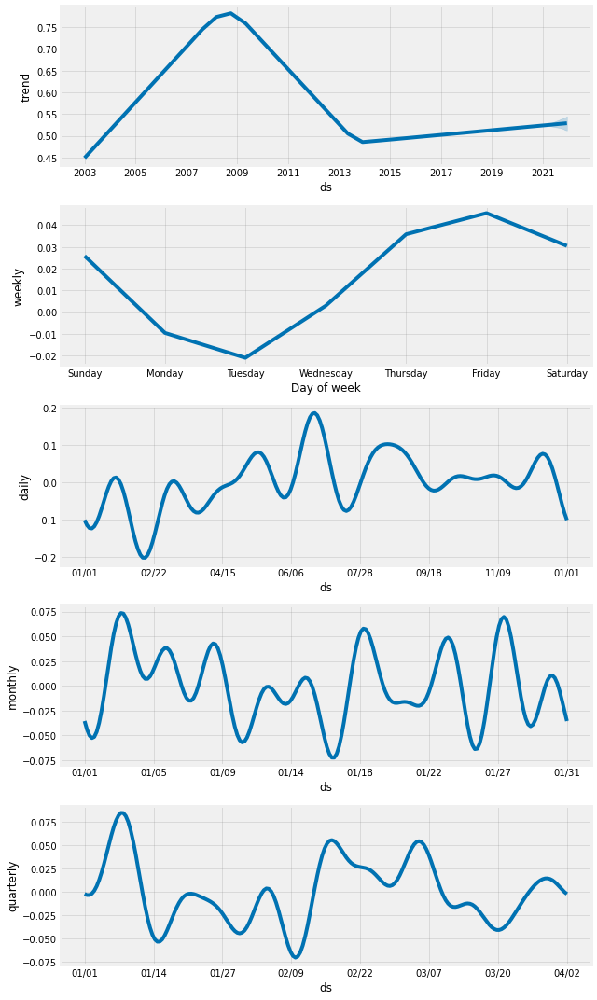

In [11]:
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
pred = n.predict(future)

fig3 = n.plot_components(pred)
fig3_1 = plot_plotly(n, pred)
fig3_1